In [ ]:
def create_features(data):

    close = data['Close'].to_numpy().flatten()
    high  = data['High'].to_numpy().flatten()
    low   = data['Low'].to_numpy().flatten()

    # Technical Indicators
    periods = [21, 75, 150]

    for p in periods:
        data[f'SMA{p}']  = talib.SMA(close, timeperiod=p)
        data[f'EMA{p}']  = talib.EMA(close, timeperiod=p)
        data[f'DEMA{p}'] = talib.DEMA(close, timeperiod=p)
        data[f'TEMA{p}'] = talib.TEMA(close, timeperiod=p)
        data[f'KAMA{p}'] = talib.KAMA(close, timeperiod=p)

    data['RSI'] = talib.RSI(close, timeperiod=21)
    data['Momentum'] = talib.MOM(close, timeperiod=21)

    # Simple Returns

    for col in ['Close','Open','High','Low']:
        data[f'{col}R'] = data[col] / data[col].shift(-1)

    return data

In [ ]:
def create_target(data, look_ahead=15):

    data['TargetReturn'] = np.log(data['Close'].shift(-look_ahead) / data['Close'])

    return data

In [ ]:
def select_features(data, target_col='TargetReturn', top_n=15):

    numeric_data = data.select_dtypes(include=[np.number])
    corr = numeric_data.corr()[target_col].drop(target_col)
    selected = corr.abs().sort_values(ascending=False).head(top_n).index.tolist()

    print("Selected Features:")
    for f in selected:
        print(f, corr[f])

    return selected

In [ ]:
def prepare_data(stock):
  data = yf.download(stock, start="2020-03-01",
                     end="2026-03-31",
                     auto_adjust=True)

  if isinstance(data.columns, pd.MultiIndex):
    data.columns = data.columns.get_level_values(0)

  data.drop(['Volume'], axis=1, inplace=True)

  data = data.reset_index()
  data.dropna(inplace=True)

  min_rows_for_talib = 60
  if len(data) < min_rows_for_talib:
    print(f"Warning: Not enough data for {stock} (found {len(data)} rows.")
    return pd.DataFrame(), []

  data = create_features(data)
  data.replace([np.inf, -np.inf], np.nan, inplace=True)
  data.dropna(inplace=True)

  data = create_target(data)
  data.dropna(inplace=True)

  features_list = select_features(data.drop(columns=['Date'], errors='ignore'), target_col='TargetReturn')

  data_selected = data[features_list + ['TargetReturn', 'Date']].copy() # Keep 'Date' in data_selected

  return data_selected, features_list

In [ ]:
def create_sequences(X, y, lookback=15):

    X_seq = []
    y_seq = []

    for i in range(lookback, len(X)):
        X_seq.append(X[i-lookback:i])
        y_seq.append(y[i])

    return np.array(X_seq), np.array(y_seq)

## LSTM

In [ ]:
stocks = ['AADI.JK', 'ADMR.JK', 'ADRO.JK', 'AKRA.JK', 'AMMN.JK',
          'AMRT.JK', 'ANTM.JK', 'ASII.JK', 'BBCA.JK', 'BBNI.JK',
          'BBRI.JK', 'BBTN.JK', 'BMRI.JK', 'BREN.JK', 'BRPT.JK',
          'BUMI.JK', 'CPIN.JK', 'CTRA.JK', 'DSSA.JK', 'EMTK.JK',
          'EXCL.JK', 'GOTO.JK', 'HEAL.JK', 'ICBP.JK', 'INCO.JK',
          'INDF.JK', 'INKP.JK', 'ISAT.JK', 'ITMG.JK', 'JPFA.JK',
          'KLBF.JK', 'MAPI.JK', 'MBMA.JK', 'MDKA.JK', 'MEDC.JK',
          'NCKL.JK', 'PGAS.JK', 'PGEO.JK', 'PTBA.JK', 'SCMA.JK',
          'SMGR.JK', 'TLKM.JK', 'TOWR.JK', 'UNTR.JK', 'UNVR.JK'
          ]

lstm_pred_returns = []
lstm_evaluation_metrics = []
lstm_all_dates_test = {}
lstm_all_y_test_inv = {}
lstm_all_y_pred_inv = {}

for stock in stocks:
    keras.backend.clear_session()

    data_selected, features = prepare_data(stock)

    if not data_selected.empty and features:
        data_selected.dropna(inplace=True);

        final_dates = data_selected['Date'].reset_index(drop=True)

        scaler_X = MinMaxScaler((-1,1))
        scaler_y = MinMaxScaler((-1,1))

        X_scaled = scaler_X.fit_transform(data_selected[features])
        y_scaled = scaler_y.fit_transform(data_selected[['TargetReturn']])

        lookback = 15
        X_seq, y_seq = create_sequences(X_scaled, y_scaled, lookback=lookback)

        dates_for_sequences = final_dates.iloc[lookback:].reset_index(drop=True)

        train_size = int(len(X_seq)*0.8)

        X_train = X_seq[:train_size]
        X_test = X_seq[train_size:]

        y_train = y_seq[:train_size]
        y_test = y_seq[train_size:]

        # Split dates for the test set
        dates_test = dates_for_sequences[train_size:].reset_index(drop=True)

        # LSTM training
        model = Sequential()
        model.add(LSTM(32, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
        model.add(LSTM(32))
        model.add(Dense(1))

        es= EarlyStopping(monitor= 'loss', min_delta= 1e-10, patience= 10, verbose= 1)
        rlr= ReduceLROnPlateau(monitor= 'loss', factor= 0.5, patience= 10, verbose= 1)

        model.compile(keras.optimizers.Adam(learning_rate= 0.01), loss= 'mean_squared_error')

        history = model.fit(X_train,
                            y_train,
                            epochs=100,
                            batch_size=32,
                            callbacks= [es, rlr],
                            validation_split=0.2,
                            verbose=1)

        # prediction
        y_pred = model.predict(X_test)
        y_pred_inv = scaler_y.inverse_transform(y_pred)
        y_test_inv = scaler_y.inverse_transform(y_test)

        y_pred_flat = y_pred_inv.flatten()
        y_test_flat = y_test_inv.flatten()

        rmse = np.sqrt(mean_squared_error(y_test_flat, y_pred_flat))
        nmse = mean_squared_error(y_test_flat, y_pred_flat) / np.var(y_test_flat)
        mae = sklearn.metrics.mean_absolute_error(y_test_flat, y_pred_flat)
        r2 = sklearn.metrics.r2_score(y_test_flat, y_pred_flat)

        print(f"\nEvaluation for {stock}")
        print("RMSE :", rmse)
        print("NMSE :", nmse)
        print("MAE  :", mae)
        print("R^2  :", r2)

        actual_direction = np.sign(y_test_flat)
        pred_direction = np.sign(y_pred_flat)

        directional_accuracy = np.mean(actual_direction == pred_direction)
        print("Directional Accuracy:", directional_accuracy)

        # Store data for combined plotting later
        lstm_all_dates_test[stock] = dates_test
        lstm_all_y_test_inv[stock] = y_test_inv
        lstm_all_y_pred_inv[stock] = y_pred_inv

        pred_return = np.mean(y_pred_inv[-15:])
        lstm_pred_returns.append(pred_return)

        # Store all evaluation metrics
        lstm_evaluation_metrics.append({
            'Stock': stock,
            'RMSE': rmse,
            'NMSE': nmse,
            'MAE': mae,
            'R^2': r2,
            'Directional Accuracy': directional_accuracy
        })
    else:
        print(f"Skipping further processing for {stock} due to insufficient data.")

In [ ]:
evaluation_metrics_df = pd.DataFrame(lstm_evaluation_metrics)
display(evaluation_metrics_df)

,Stock,RMSE,NMSE,MAE,R^2,Directional Accuracy
0,ADMR.JK,0.067508,0.238174,0.045962,0.761826,0.868687
1,ADRO.JK,0.005940,0.004289,0.004339,0.995711,0.984127
2,AKRA.JK,0.009903,0.013868,0.003396,0.986132,0.957672
3,AMMN.JK,0.134864,1.295566,0.118244,-0.295566,0.851852
4,AMRT.JK,0.011517,0.013863,0.007347,0.986137,0.973545
5,ANTM.JK,0.033982,0.055427,0.026354,0.944573,0.936508
6,ASII.JK,0.003238,0.005523,0.002467,0.994477,0.978836
7,BBCA.JK,0.006412,0.010682,0.002867,0.989318,0.989418
8,BBNI.JK,0.003122,0.002205,0.002061,0.997795,0.978836
9,BBRI.JK,0.009117,0.015154,0.005755,0.984846,0.989418


## Bidirectional LSTM

In [ ]:
stocks = ['AADI.JK', 'ADMR.JK', 'ADRO.JK', 'AKRA.JK', 'AMMN.JK',
          'AMRT.JK', 'ANTM.JK', 'ASII.JK', 'BBCA.JK', 'BBNI.JK',
          'BBRI.JK', 'BBTN.JK', 'BMRI.JK', 'BREN.JK', 'BRPT.JK',
          'BUMI.JK', 'CPIN.JK', 'CTRA.JK', 'DSSA.JK', 'EMTK.JK',
          'EXCL.JK', 'GOTO.JK', 'HEAL.JK', 'ICBP.JK', 'INCO.JK',
          'INDF.JK', 'INKP.JK', 'ISAT.JK', 'ITMG.JK', 'JPFA.JK',
          'KLBF.JK', 'MAPI.JK', 'MBMA.JK', 'MDKA.JK', 'MEDC.JK',
          'NCKL.JK', 'PGAS.JK', 'PGEO.JK', 'PTBA.JK', 'SCMA.JK',
          'SMGR.JK', 'TLKM.JK', 'TOWR.JK', 'UNTR.JK', 'UNVR.JK'
          ]

bilstm_pred_returns = []
bilstm_evaluation_metrics = []
bilstm_all_dates_test = {}
bilstm_all_y_test_inv = {}
bilstm_all_y_pred_inv = {}

for stock in stocks:
    keras.backend.clear_session()

    data_selected, features = prepare_data(stock)

    if not data_selected.empty and features:
        data_selected.dropna(inplace=True);

        final_dates = data_selected['Date'].reset_index(drop=True)

        scaler_X = MinMaxScaler((-1,1))
        scaler_y = MinMaxScaler((-1,1))

        X_scaled = scaler_X.fit_transform(data_selected[features])
        y_scaled = scaler_y.fit_transform(data_selected[['TargetReturn']])

        lookback = 15
        X_seq, y_seq = create_sequences(X_scaled, y_scaled, lookback=lookback)

        dates_for_sequences = final_dates.iloc[lookback:].reset_index(drop=True)

        train_size = int(len(X_seq)*0.8)

        X_train = X_seq[:train_size]
        X_test = X_seq[train_size:]

        y_train = y_seq[:train_size]
        y_test = y_seq[train_size:]

        dates_test = dates_for_sequences[train_size:].reset_index(drop=True)

        # LSTM training
        model = Sequential()
        model.add(Bidirectional(LSTM(32, return_sequences=True), input_shape=(X_train.shape[1], X_train.shape[2])))
        model.add(Bidirectional(LSTM(32)))
        model.add(Dense(1))

        es= EarlyStopping(monitor= 'loss', min_delta= 1e-10, patience= 10, verbose= 1)
        rlr= ReduceLROnPlateau(monitor= 'loss', factor= 0.5, patience= 10, verbose= 1)

        model.compile(keras.optimizers.Adam(learning_rate= 0.01), loss= 'mean_squared_error')

        history = model.fit(X_train,
                            y_train,
                            epochs=100,
                            batch_size=32,
                            callbacks= [es, rlr],
                            validation_split=0.2,
                            verbose=1)

        # prediction
        y_pred = model.predict(X_test)
        y_pred_inv = scaler_y.inverse_transform(y_pred)
        y_test_inv = scaler_y.inverse_transform(y_test)

        y_pred_flat = y_pred_inv.flatten()
        y_test_flat = y_test_inv.flatten()

        rmse = np.sqrt(mean_squared_error(y_test_flat, y_pred_flat))
        nmse = mean_squared_error(y_test_flat, y_pred_flat) / np.var(y_test_flat)
        mae = sklearn.metrics.mean_absolute_error(y_test_flat, y_pred_flat)
        r2 = sklearn.metrics.r2_score(y_test_flat, y_pred_flat)

        print(f"\nEvaluation for {stock}")
        print("RMSE :", rmse)
        print("NMSE :", nmse)
        print("MAE  :", mae)
        print("R^2  :", r2)

        actual_direction = np.sign(y_test_flat)
        pred_direction = np.sign(y_pred_flat)

        directional_accuracy = np.mean(actual_direction == pred_direction)
        print("Directional Accuracy:", directional_accuracy)

        # Store data for combined plotting later
        bilstm_all_dates_test[stock] = dates_test
        bilstm_all_y_test_inv[stock] = y_test_inv
        bilstm_all_y_pred_inv[stock] = y_pred_inv

        pred_return = np.mean(y_pred_inv[-15:])
        bilstm_pred_returns.append(pred_return)

        # Store all evaluation metrics
        bilstm_evaluation_metrics.append({
            'Stock': stock,
            'RMSE': rmse,
            'NMSE': nmse,
            'MAE': mae,
            'R^2': r2,
            'Directional Accuracy': directional_accuracy
        })
    else:
        print(f"Skipping further processing for {stock} due to insufficient data.")

In [ ]:
evaluation_metrics_df = pd.DataFrame(bilstm_evaluation_metrics)
display(evaluation_metrics_df)

,Stock,RMSE,NMSE,MAE,R^2,Directional Accuracy
0,ADMR.JK,0.008197,0.003511,0.005273,0.996489,1.000000
1,ADRO.JK,0.001694,0.000349,0.001261,0.999651,0.994709
2,AKRA.JK,0.004602,0.002995,0.002344,0.997005,0.962963
3,AMMN.JK,0.054330,0.210255,0.044387,0.789745,0.962963
4,AMRT.JK,0.004641,0.002251,0.002731,0.997749,0.984127
5,ANTM.JK,0.007439,0.002656,0.003789,0.997344,0.989418
6,ASII.JK,0.001110,0.000649,0.000790,0.999351,0.978836
7,BBCA.JK,0.001668,0.000723,0.001090,0.999277,0.989418
8,BBNI.JK,0.001924,0.000837,0.001372,0.999163,0.978836
9,BBRI.JK,0.001983,0.000717,0.001449,0.999283,1.000000


Skipping AADI.JK for plotting due to missing data in one or both models.


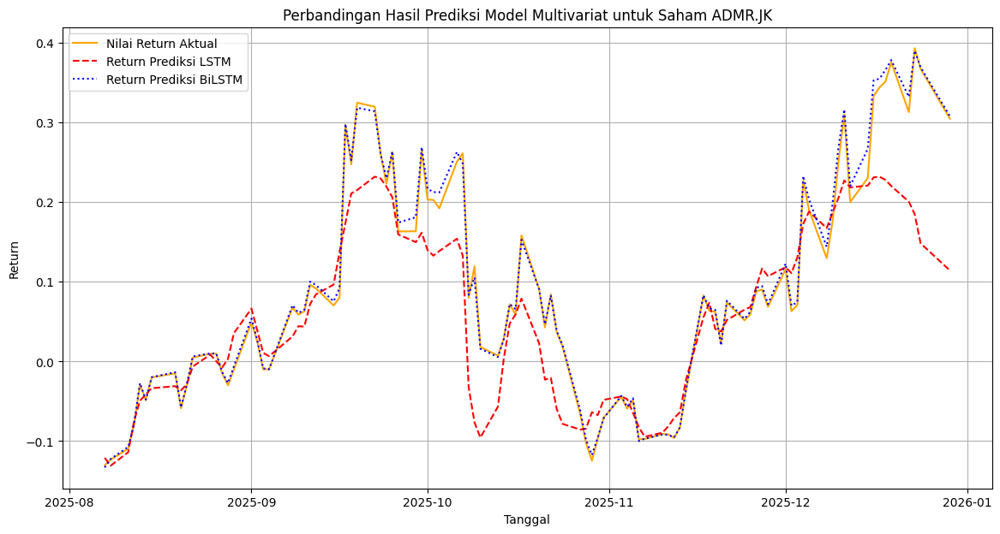

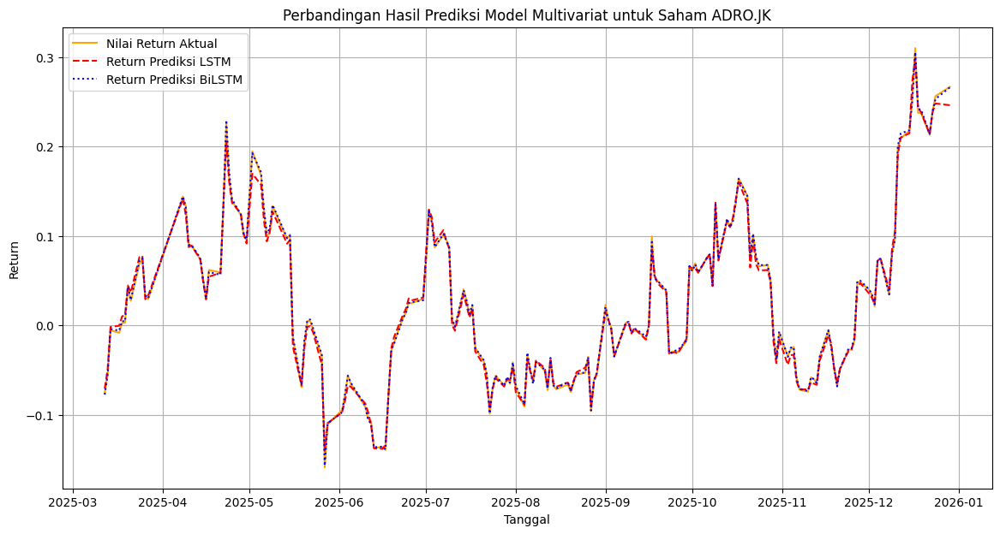

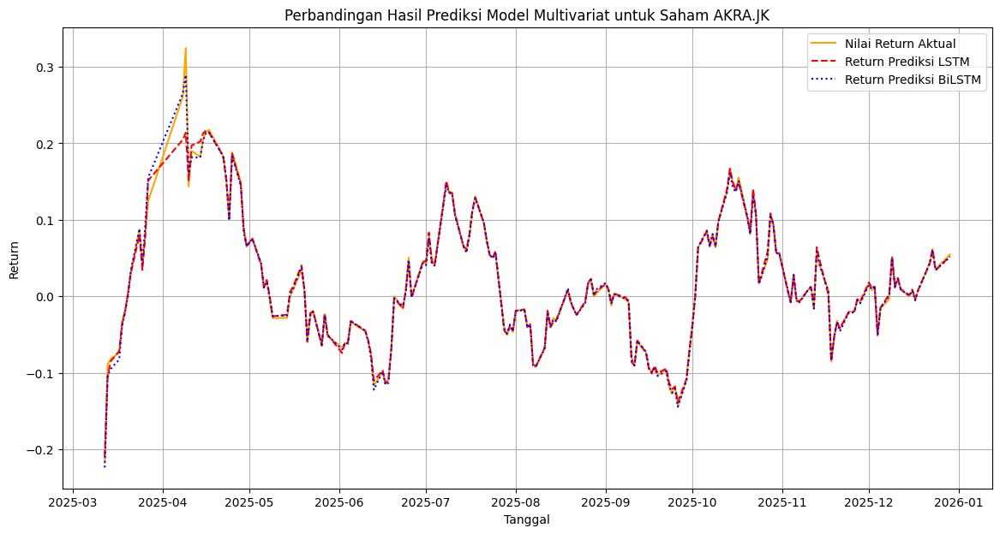

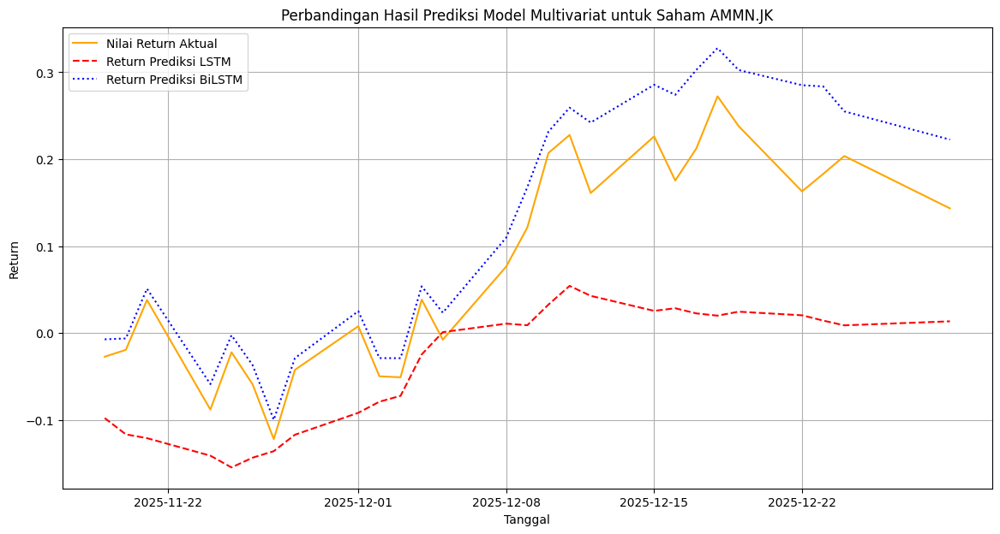

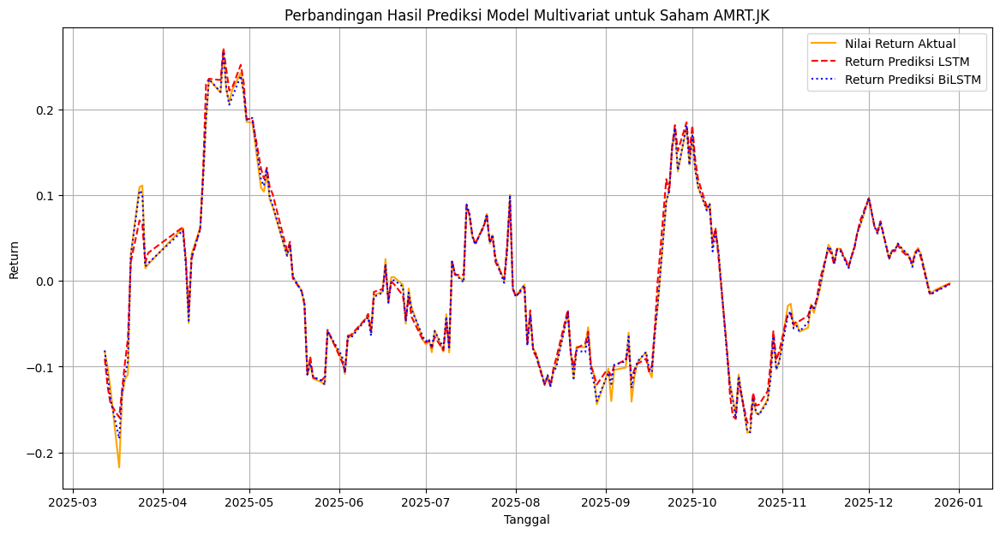

...

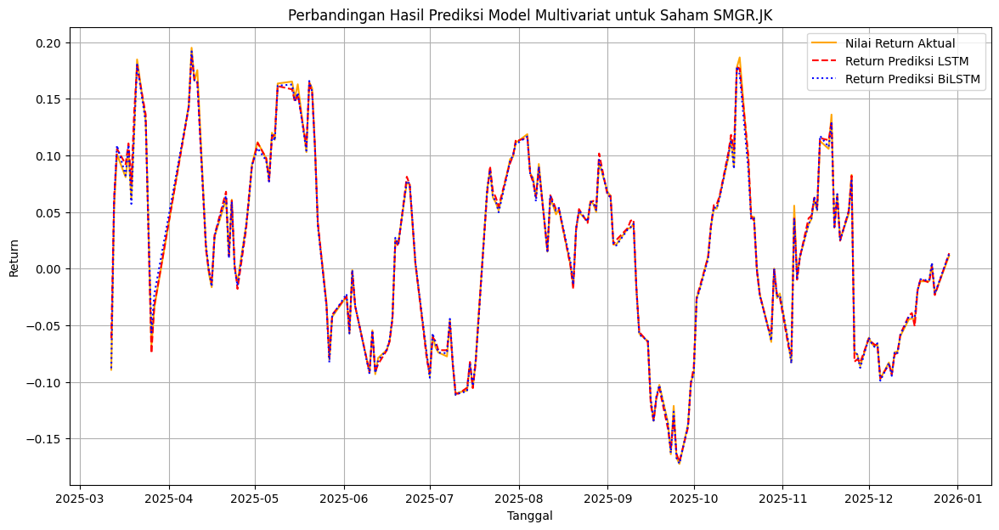

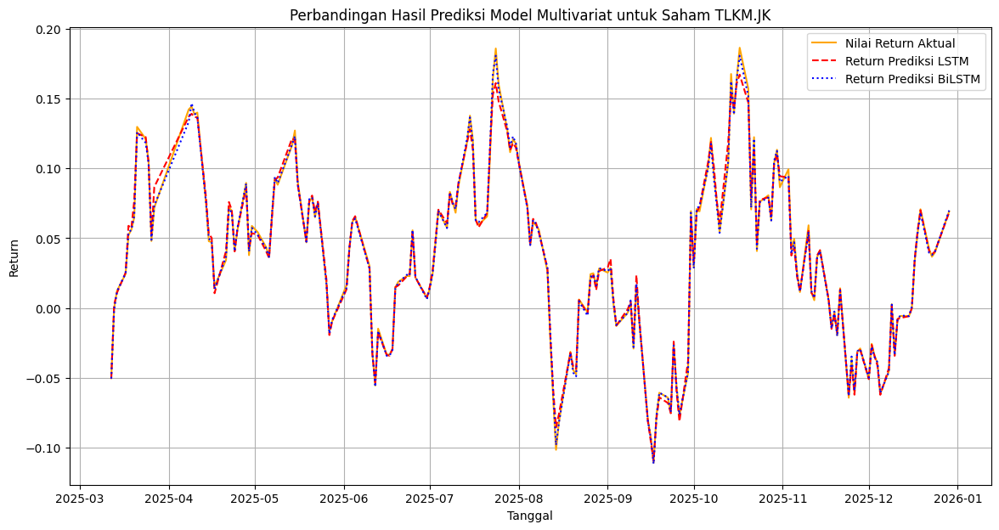

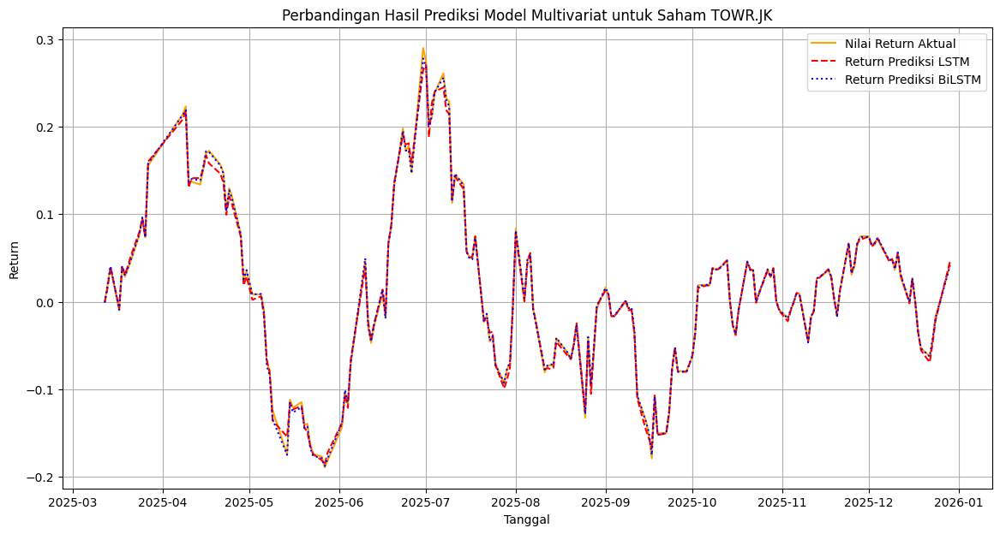

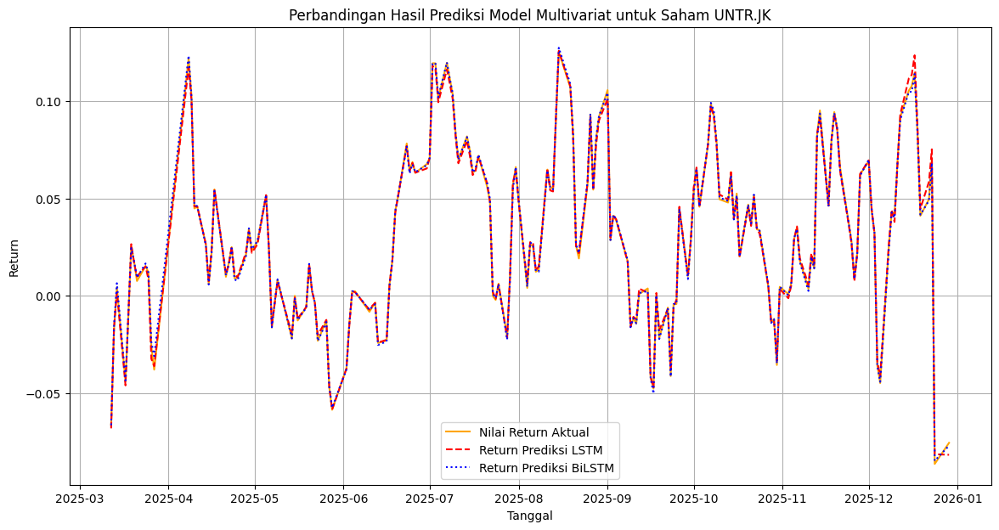

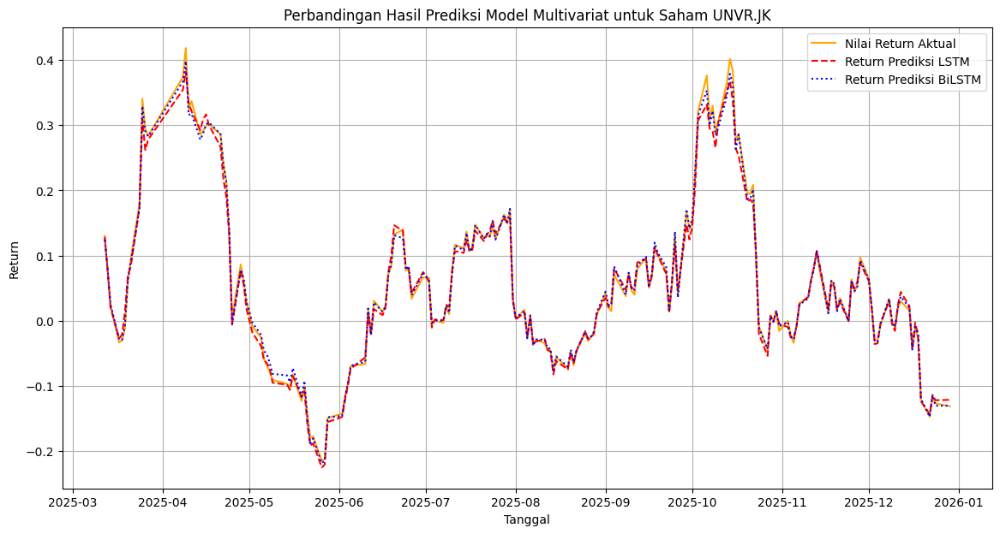

In [ ]:
for stock in stocks:
   if stock in lstm_all_dates_test and stock in bilstm_all_dates_test:
        dates_test = lstm_all_dates_test[stock]
        y_test_inv = lstm_all_y_test_inv[stock]
        lstm_y_pred_inv = lstm_all_y_pred_inv[stock]
        bilstm_y_pred_inv = bilstm_all_y_pred_inv[stock]

        plt.figure(figsize=(14, 7))
        plt.plot(dates_test, y_test_inv, label='Nilai Return Aktual', color='orange')
        plt.plot(dates_test, lstm_y_pred_inv, label='Return Prediksi LSTM', color='red', linestyle='--')
        plt.plot(dates_test, bilstm_y_pred_inv, label='Return Prediksi BiLSTM', color='blue', linestyle=':')

        plt.title(f'Perbandingan Hasil Prediksi Model Multivariat untuk Saham {stock}')
        plt.xlabel('Tanggal')
        plt.ylabel('Return')
        plt.legend()
        plt.grid(True)
        plt.show()
    else:
        print(f"Skipping {stock} for plotting due to missing data in one or both models.")

Skipping AADI.JK for plotting due to missing data in one or both models.


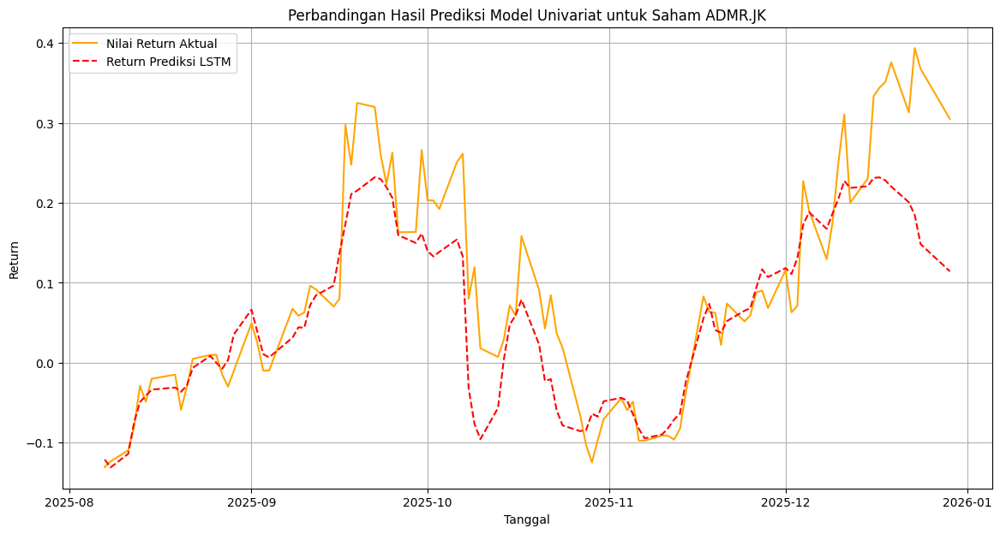

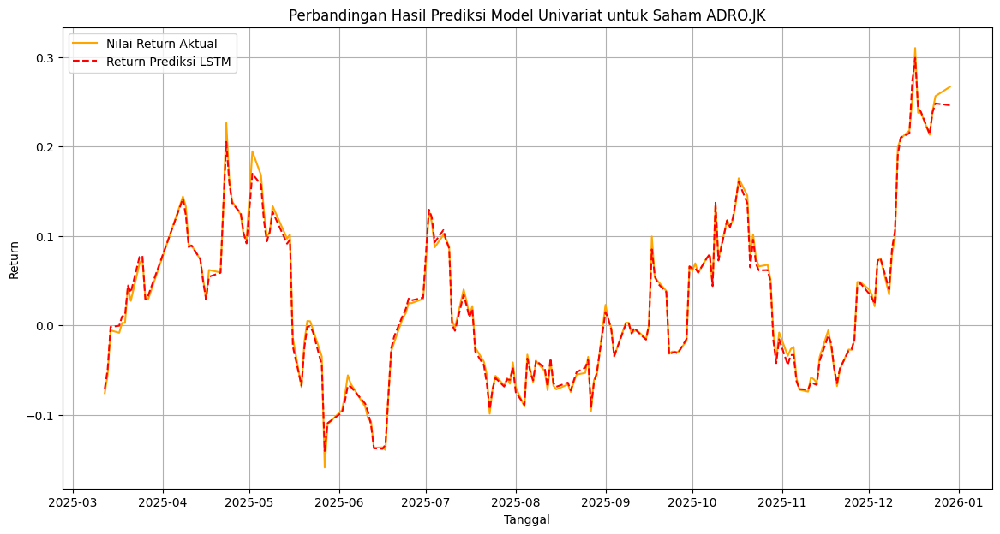

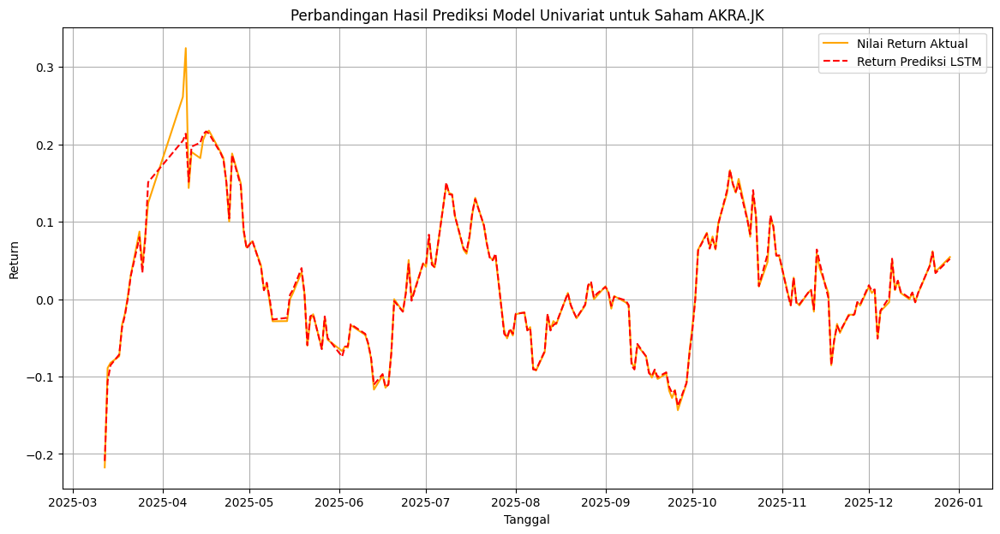

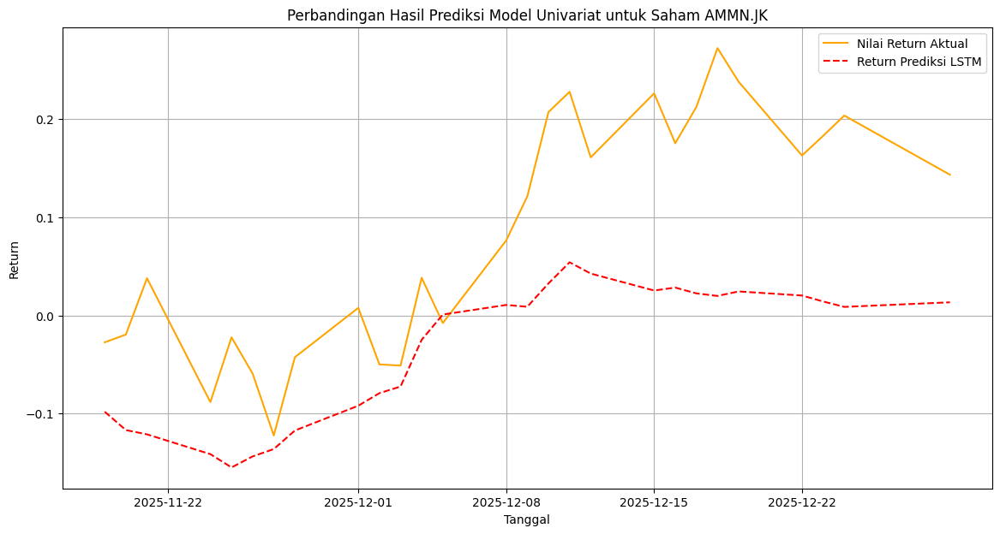

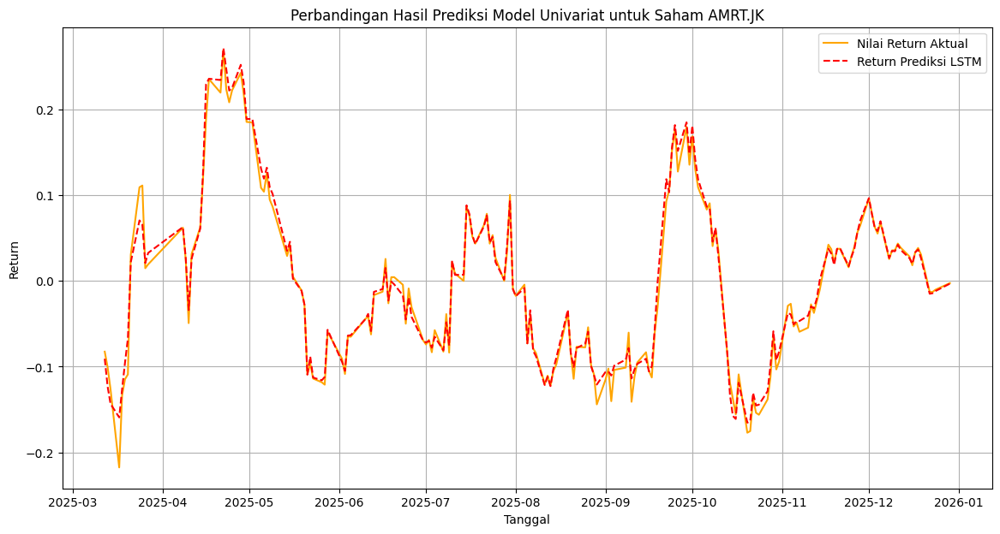

...

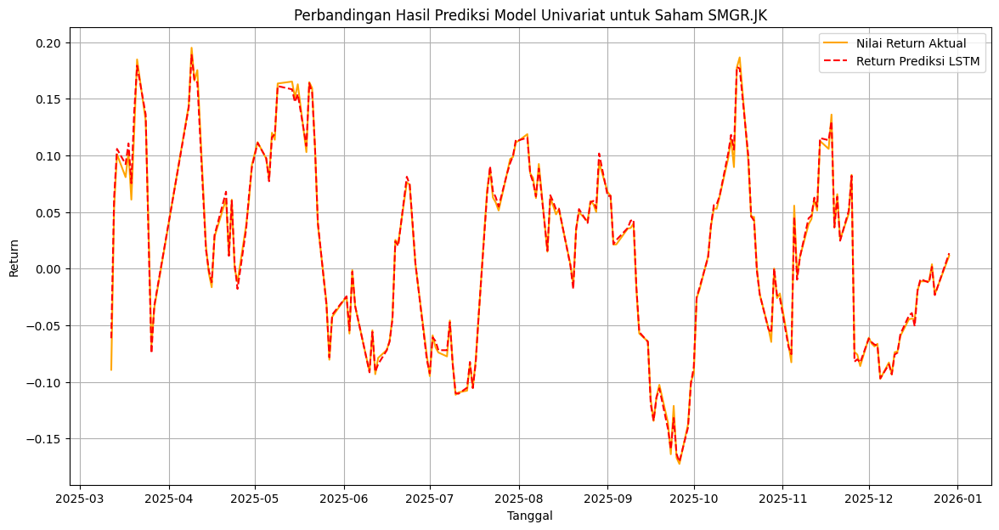

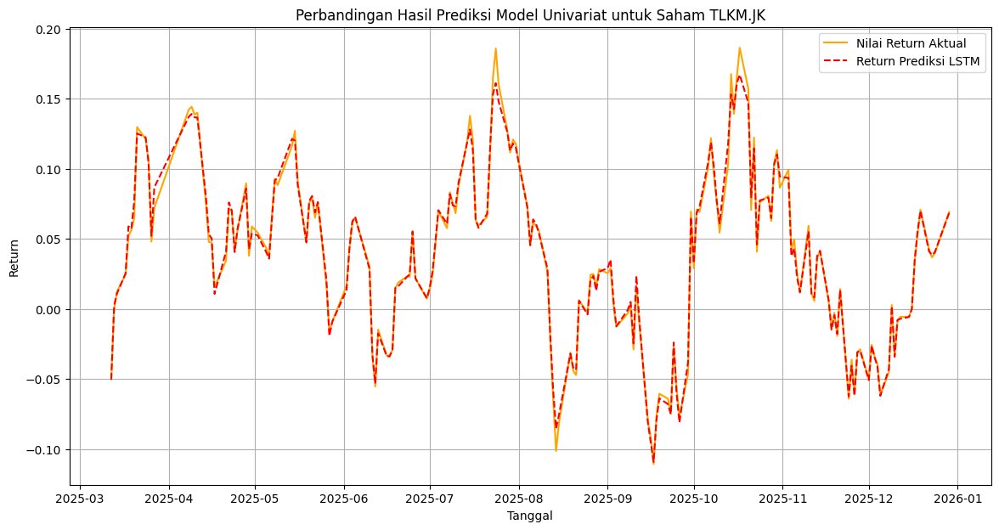

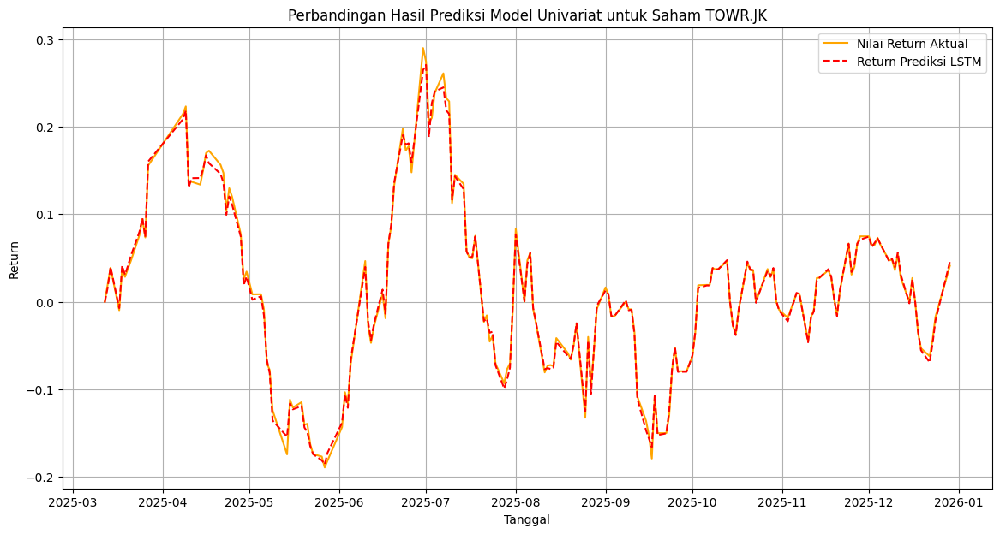

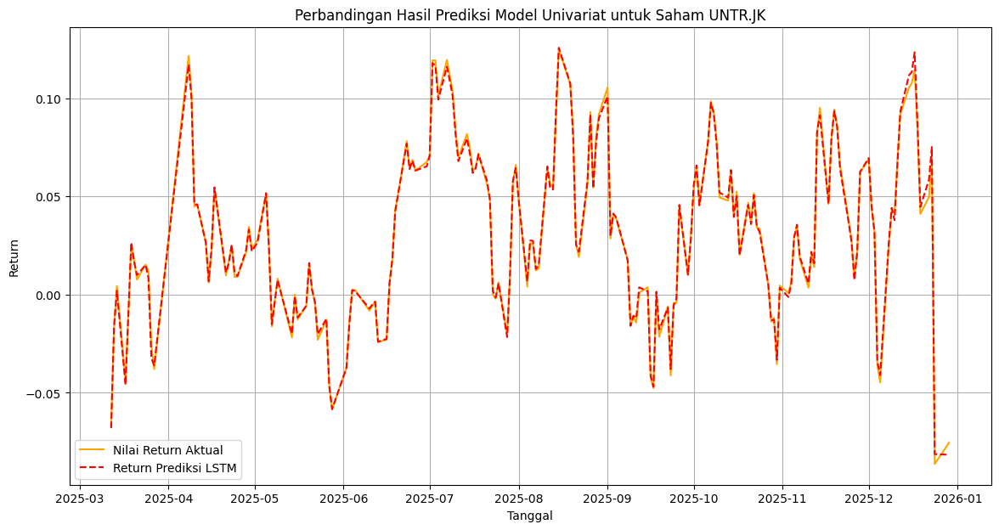

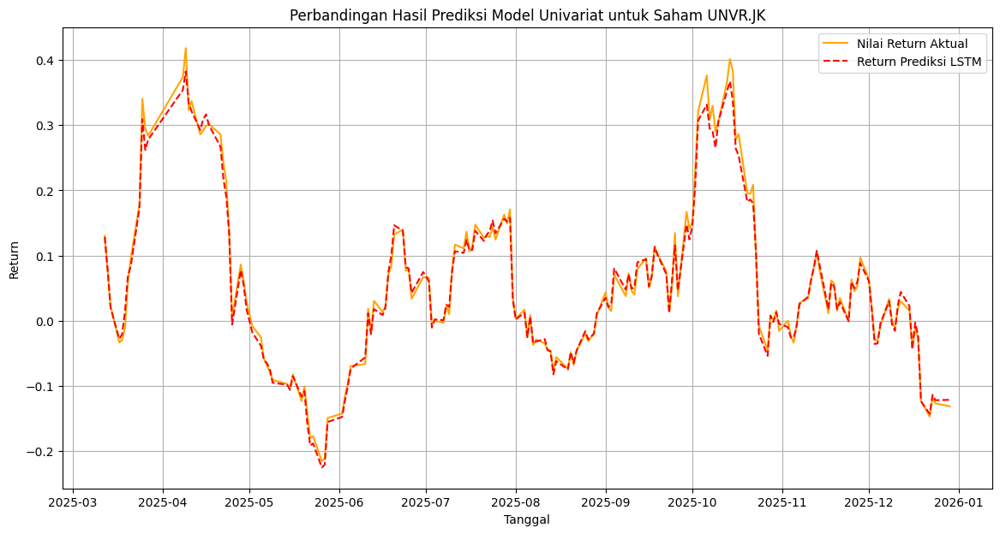

In [ ]:
for stock in stocks:
    if stock in lstm_all_dates_test and stock in bilstm_all_dates_test:
        dates_test = lstm_all_dates_test[stock]
        y_test_inv = lstm_all_y_test_inv[stock]
        lstm_y_pred_inv = lstm_all_y_pred_inv[stock]
        bilstm_y_pred_inv = bilstm_all_y_pred_inv[stock]

        plt.figure(figsize=(14, 7))
        plt.plot(dates_test, y_test_inv, label='Nilai Return Aktual', color='orange')
        plt.plot(dates_test, lstm_y_pred_inv, label='Return Prediksi LSTM', color='red', linestyle='--')
        #plt.plot(dates_test, bilstm_y_pred_inv, label='Return Prediksi BiLSTM', color='blue', linestyle=':')

        plt.title(f'Perbandingan Hasil Prediksi Model Univariat untuk Saham {stock}')
        plt.xlabel('Tanggal')
        plt.ylabel('Return')
        plt.legend()
        plt.grid(True)
        plt.show()
    else:
        print(f"Skipping {stock} for plotting due to missing data in one or both models.")

Skipping AADI.JK for plotting due to missing data in one or both models.


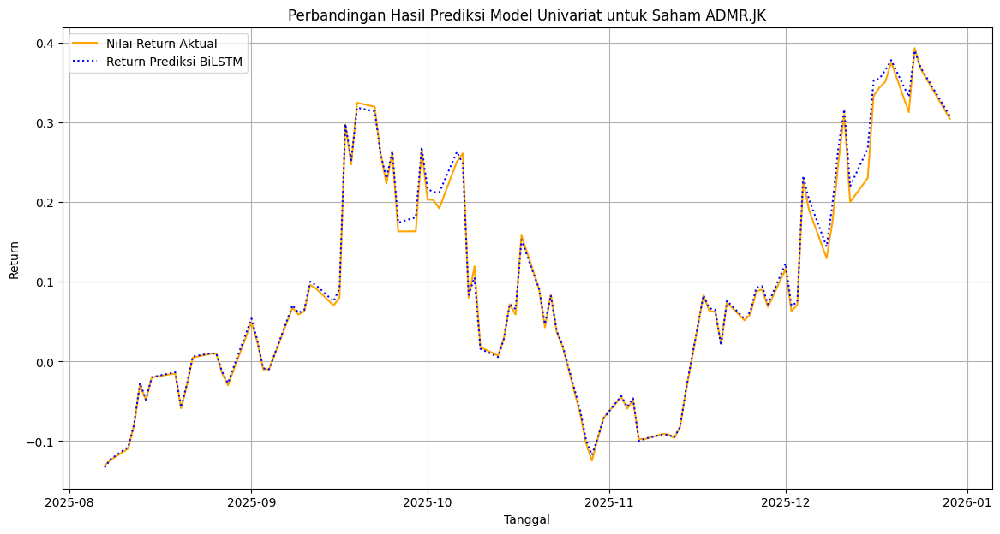

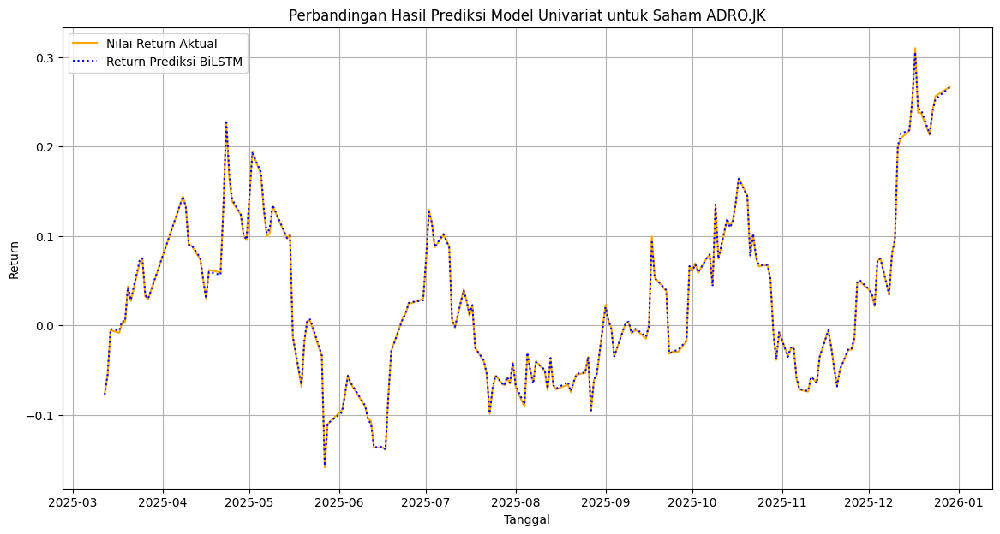

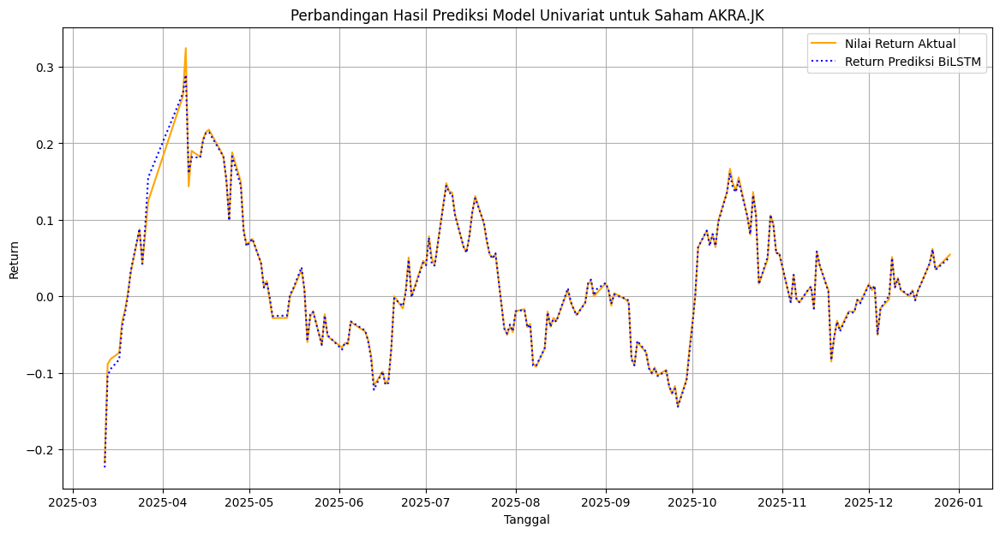

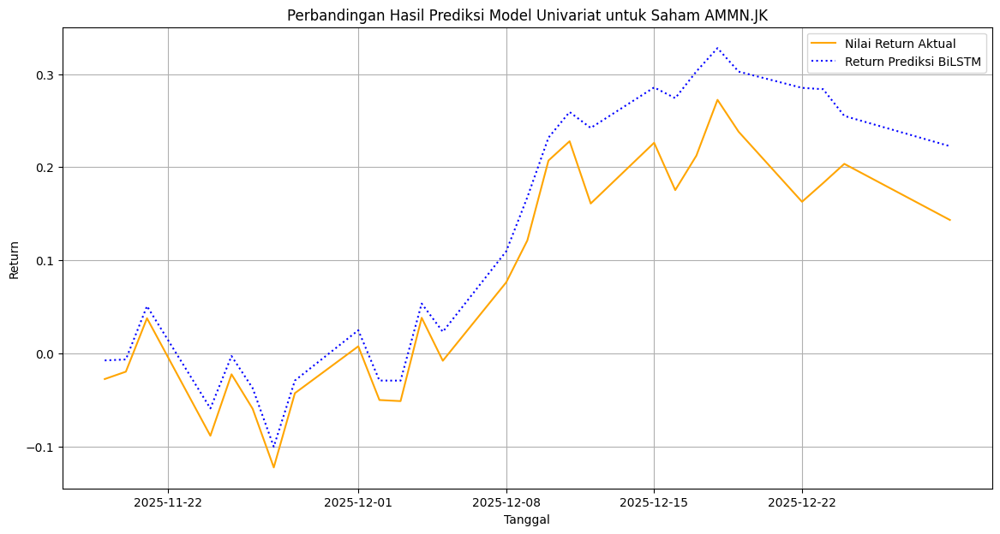

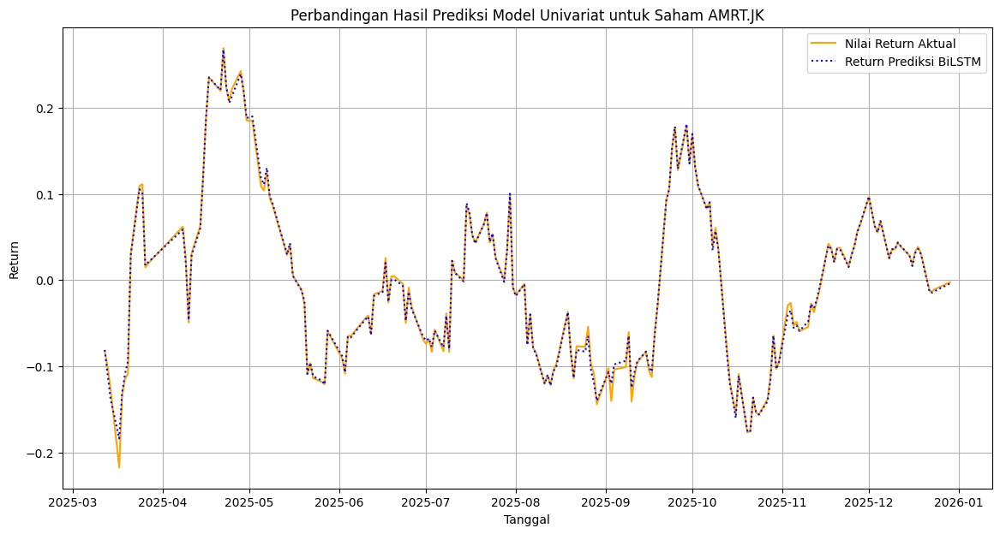

...

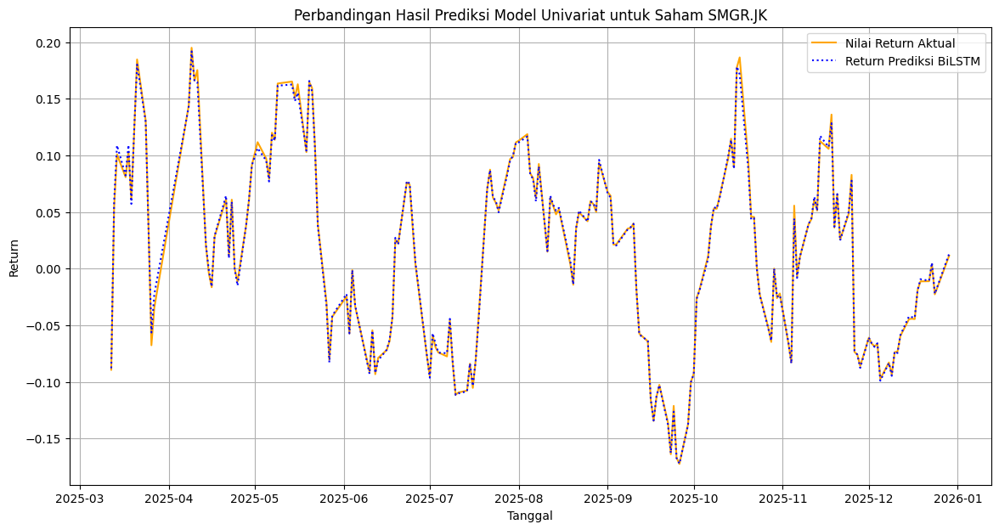

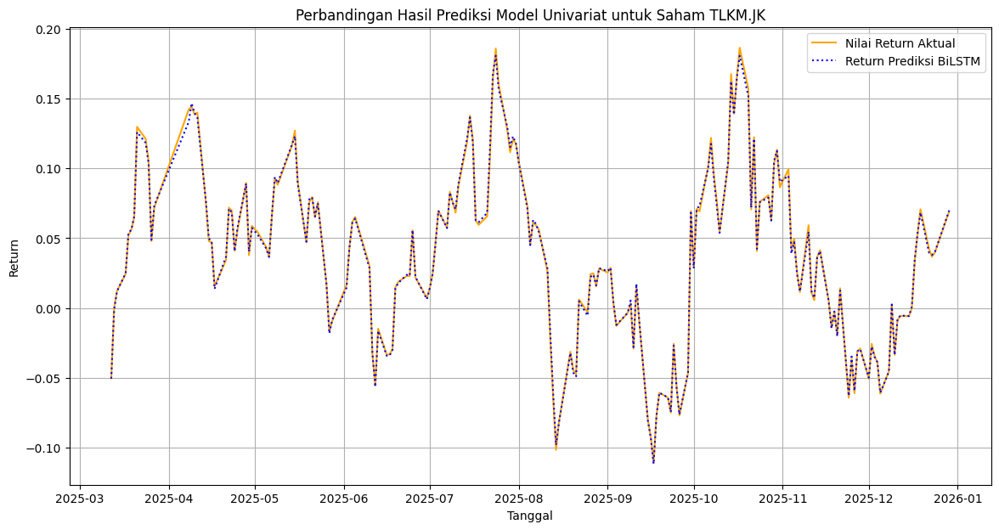

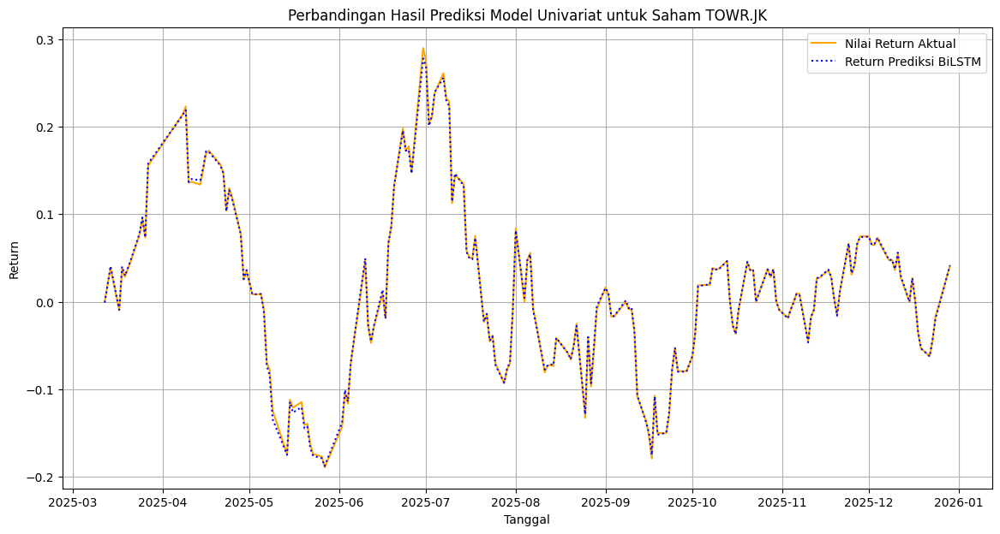

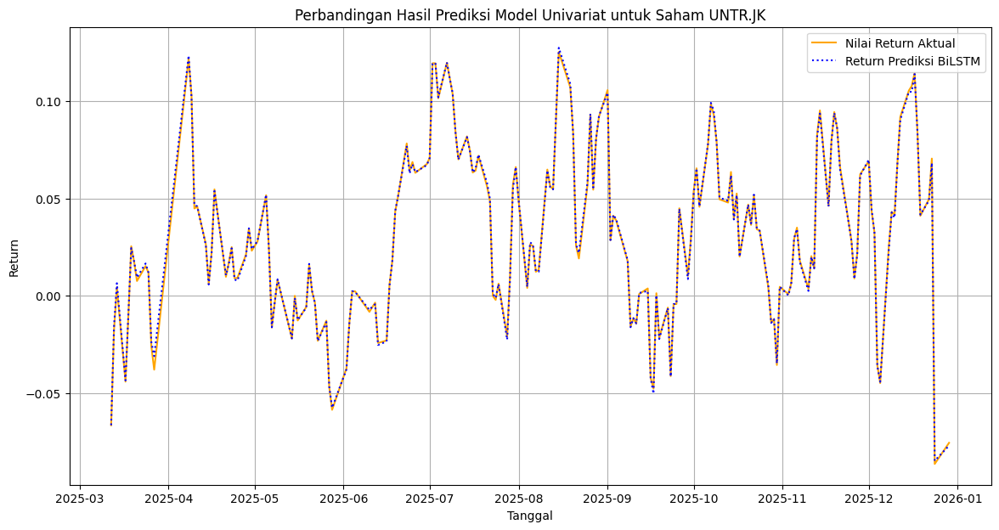

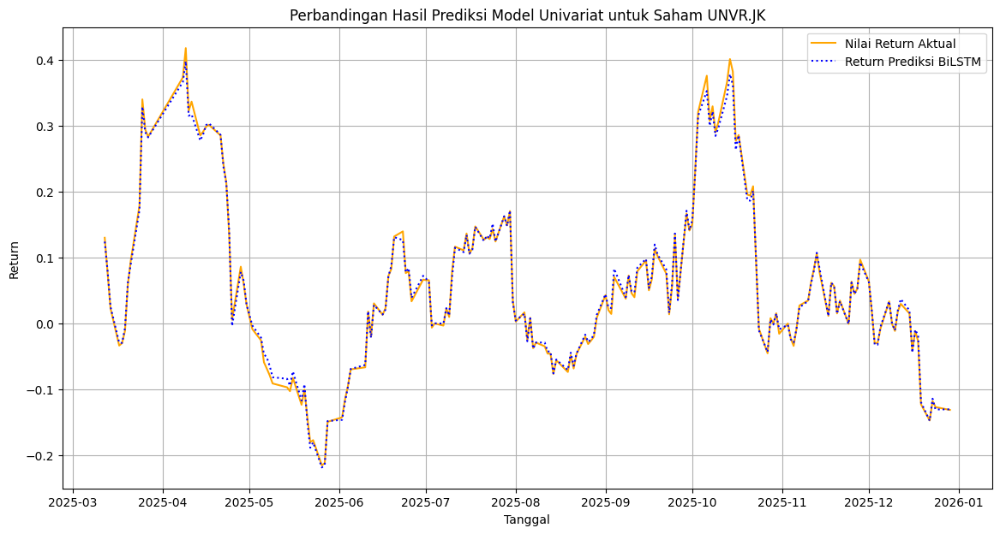

In [ ]:
for stock in stocks:
    if stock in lstm_all_dates_test and stock in bilstm_all_dates_test:
        dates_test = lstm_all_dates_test[stock]
        y_test_inv = lstm_all_y_test_inv[stock]
        lstm_y_pred_inv = lstm_all_y_pred_inv[stock]
        bilstm_y_pred_inv = bilstm_all_y_pred_inv[stock]

        plt.figure(figsize=(14, 7))
        plt.plot(dates_test, y_test_inv, label='Nilai Return Aktual', color='orange')
        #plt.plot(dates_test, lstm_y_pred_inv, label='Return Prediksi LSTM', color='red', linestyle='--')
        plt.plot(dates_test, bilstm_y_pred_inv, label='Return Prediksi BiLSTM', color='blue', linestyle=':')

        plt.title(f'Perbandingan Hasil Prediksi Model Univariat untuk Saham {stock}')
        plt.xlabel('Tanggal')
        plt.ylabel('Return')
        plt.legend()
        plt.grid(True)
        plt.show()
    else:
        print(f"Skipping {stock} for plotting due to missing data in one or both models.")